In [1]:
!pip install transformers timm
!pip install protobuf==3.20.3
!pip install roboflow
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 62.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 28.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 71.3 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.

In [ ]:
import torch
import os
import torch.optim as optim
import shutil 
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random

from torch.utils.data import DataLoader
from torchvision.datasets import CocoDetection
from transformers import RTDetrForObjectDetection, RTDetrV2ForObjectDetection, RTDetrImageProcessor
from roboflow import Roboflow
from tqdm import tqdm
from torch.utils.data import Subset
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from IPython.display import FileLink 
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.optim.lr_scheduler import StepLR


In [3]:
rf = Roboflow(api_key="sNwZKFyXE0vHSdAqPXX0")
project = rf.workspace("main-workspace-vcien").project("birdnest-nzpjl-inn3e")
version = project.version(4)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to BirdNest-4 in coco:: 100%|██████████| 2897/2897 [00:00<00:00, 7277.75it/s]


In [4]:
# CHECKPOINT = "PekingU/rtdetr_r50vd_coco_o365"
CHECKPOINT = "PekingU/rtdetr_v2_r101vd" 
SAVE_DIR = "ebn_rtdetr_model"

processor = RTDetrImageProcessor.from_pretrained(CHECKPOINT)

preprocessor_config.json:   0%|          | 0.00/444 [00:00<?, ?B/s]

In [11]:
def collate_fn(batch):
    images = [item[0] for item in batch]
    targets = [item[1] for item in batch]
    
    # --- NEW: CAPTURE ORIGINAL SIZES ---
    # RT-DETR expects (Height, Width)
    original_sizes = torch.tensor([[img.height, img.width] for img in images])
    
    formatted_targets = []
    for i, target in enumerate(targets):
        new_target = []
        for t in target:
            t_new = t.copy()
            t_new['category_id'] = t['category_id'] - 1 
            new_target.append(t_new)

        formatted_targets.append({
            "image_id": i, 
            "annotations": new_target
        })
        
    inputs = processor(images=images, annotations=formatted_targets, return_tensors="pt")
    
    # --- NEW: ADD SIZES TO BATCH ---
    inputs["original_sizes"] = original_sizes
    
    return inputs

In [12]:
# transform = transforms.Compose([
#     transforms.ToImage(),
#     transforms.ToDtype(torch.float32, scale=True),
# ])

train_dataset = CocoDetection(
    root="BirdNest-4/train",
    annFile="BirdNest-4/train/_annotations.coco.json",
)

val_dataset = CocoDetection(
    root="BirdNest-4/valid",
    annFile="BirdNest-4/valid/_annotations.coco.json",
)

test_dataset = CocoDetection(
    root="BirdNest-4/test",
    annFile="BirdNest-4/test/_annotations.coco.json",
)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [13]:
small_train_dataset = Subset(train_dataset, list(range(20)))
small_val_dataset = Subset(val_dataset, list(range(10)))

small_train_loader = DataLoader(small_train_dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)
small_val_loader = DataLoader(small_val_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_CLASSES = 3

model = RTDetrV2ForObjectDetection.from_pretrained(CHECKPOINT, num_labels=NUM_CLASSES, ignore_mismatched_sizes=True)
model.to(device) 
model.train()

optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

In [ ]:
print("Starting Training Loop...")

for epoch in range(5):
    epoch_loss = 0

    # Wrap the DataLoader with tqdm
    for idx, batch in enumerate(tqdm(small_train_loader, desc=f"Epoch {epoch+1}", unit="batch")):
        
        # Move batch to device
        pixel_values = batch['pixel_values'].to(device)
        labels = [{k: v.to(device) for k, v in t.items()} for t in batch['labels']]
        
        optimizer.zero_grad()
        
        # Forward pass (labels trigger loss)
        outputs = model(pixel_values=pixel_values, labels=labels)
        loss = outputs.loss
        
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()

    avg_loss = epoch_loss / len(small_train_loader)
    print(f"Epoch {epoch+1} Complete | Avg Loss: {avg_loss:.4f}")

In [17]:
class NetworkTrainer:
    def __init__(self, model, train_loader, val_loader, optimizer, processor, device, save_dir="checkpoints"):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.optimizer = optimizer
        self.processor = processor
        self.device = device
        self.save_dir = save_dir
        
        # --- NEW 1: STABLE SCHEDULER ---
        # Runs at full speed for 10 epochs, then cuts LR by 90% (e.g., 1e-4 -> 1e-5).
        # This is much more stable for fine-tuning.
        self.scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
        
        self.metric = MeanAveragePrecision(iou_type="bbox", class_metrics=True).to(device)
        os.makedirs(self.save_dir, exist_ok=True)
        self.best_map = 0.0

    def train_one_epoch(self, epoch_index):
        self.model.train()
        epoch_loss = 0
        accumulation_steps = 4 
        
        progress_bar = tqdm(self.train_loader, desc=f"Train Epoch {epoch_index}", unit="batch")
        
        self.optimizer.zero_grad() 
        
        for i, batch in enumerate(progress_bar):
            pixel_values = batch['pixel_values'].to(self.device)
            labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch['labels']]
            
            outputs = self.model(pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            
            loss = loss / accumulation_steps
            loss.backward()
            
            if (i + 1) % accumulation_steps == 0:
                self.optimizer.step()
                self.optimizer.zero_grad()
            
            loss_val = loss.item() * accumulation_steps
            epoch_loss += loss_val
            
            # Show current LR
            current_lr = self.optimizer.param_groups[1]['lr']
            progress_bar.set_postfix({"loss": f"{loss_val:.4f}", "lr": f"{current_lr:.6f}"})
            
        # --- NEW 2: THE BUG FIX ---
        # Apply any leftover gradients at the end of the epoch
        if (i + 1) % accumulation_steps != 0:
            self.optimizer.step()
            self.optimizer.zero_grad()
            
        # Step the scheduler *after* the epoch is fully done
        self.scheduler.step()
        
        return epoch_loss / len(self.train_loader)

    @torch.no_grad()
    def evaluate(self, epoch_index):
        # This function was already correct, no changes needed
        self.model.eval()
        self.metric.reset()
        progress_bar = tqdm(self.val_loader, desc=f"Valid Epoch {epoch_index}", unit="batch")
        
        for batch in progress_bar:
            pixel_values = batch['pixel_values'].to(self.device)
            labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch['labels']]
            target_sizes = batch["original_sizes"].to(self.device)
            
            outputs = self.model(pixel_values=pixel_values)
            results = self.processor.post_process_object_detection(
                outputs, 
                target_sizes=target_sizes, 
                threshold=0.01 
            )
            
            formatted_targets = []
            for t, sizes in zip(labels, target_sizes):
                img_h, img_w = sizes
                boxes = t['boxes']
                cx, cy, w, h = boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3]
                x1 = (cx - 0.5 * w) * img_w
                y1 = (cy - 0.5 * h) * img_h
                x2 = (cx + 0.5 * w) * img_w
                y2 = (cy + 0.5 * h) * img_h
                absolute_boxes = torch.stack([x1, y1, x2, y2], dim=1)

                formatted_targets.append({
                    "boxes": absolute_boxes, 
                    "labels": t['class_labels']
                })
            self.metric.update(results, formatted_targets)
            
        metrics = self.metric.compute()
        return metrics

    def fit(self, num_epochs):
        # This function was already correct, no changes needed
        print(f"Starting training for {num_epochs} epochs on {self.device}...")
        
        for epoch in range(1, num_epochs + 1):
            train_loss = self.train_one_epoch(epoch)
            val_metrics = self.evaluate(epoch)
            
            current_map_score = val_metrics['map'] 
            map_50 = val_metrics['map_50']
            
            print(f"\nEpoch {epoch} Summary:")
            print(f"Train Loss:    {train_loss:.4f}")
            print(f"Val mAP 50:    {map_50:.4f}")
            print(f"Val mAP 50-95: {current_map_score:.4f}")
            
            if current_map_score > self.best_map:
                print(f"--> Improvement! (mAP 50-95: {self.best_map:.4f} -> {current_map_score:.4f})")
                self.best_map = current_map_score
                print("Saving best model...")
                self.model.save_pretrained(os.path.join(self.save_dir, "best_hf_model"))
                torch.save(self.model.state_dict(), os.path.join(self.save_dir, "best_model.pt"))
            
            print("-" * 50)
        
        print("Training finished. Saving last model...")
        self.model.save_pretrained(os.path.join(self.save_dir, "last_hf_model"))
        torch.save(self.model.state_dict(), os.path.join(self.save_dir, "last_model.pt"))

In [19]:
# 1. Setup (As you already have)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = RTDetrV2ForObjectDetection.from_pretrained(CHECKPOINT, num_labels=3, ignore_mismatched_sizes=True)
model.to(device)

# Use the parameter groups optimizer we discussed earlier for best results
param_dicts = [
    {"params": [p for n, p in model.named_parameters() if "backbone" in n and p.requires_grad], "lr": 1e-5},
    {"params": [p for n, p in model.named_parameters() if "backbone" not in n and p.requires_grad], "lr": 1e-4},
]
optimizer = torch.optim.AdamW(param_dicts, weight_decay=1e-4)

# 2. Instantiate Trainer
trainer = NetworkTrainer(
    model=model,
    train_loader=train_loader, 
    val_loader=val_loader,     
    optimizer=optimizer,
    processor=processor,
    device=device,
    save_dir=SAVE_DIR
)

Some weights of RTDetrV2ForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_v2_r101vd and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([3]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([3]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([3]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- model.deco

In [20]:
# 3. Run
trainer.fit(num_epochs=30)

# 4. Provide downloadable link 
print("Training Complete. Preparing download...")

zip_filename = "best_model_output"

# Zip the directory where the model was saved
# usage: make_archive(output_filename, 'format', directory_to_zip)
shutil.make_archive(zip_filename, 'zip', SAVE_DIR)

print(f"Successfully zipped '{SAVE_DIR}' into '{zip_filename}.zip'")
print("Click the link below to download your model:")

# Create a clickable link
FileLink(f'{zip_filename}.zip')

Starting training for 30 epochs on cuda...


Valid Epoch 1: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 1 Summary:
Train Loss:    51.0308
Val mAP 50:    0.4139
Val mAP 50-95: 0.3994
--> Improvement! (mAP 50-95: 0.0000 -> 0.3994)
Saving best model...
--------------------------------------------------


Valid Epoch 2: 100%|██████████| 121/121 [00:25<00:00,  4.79batch/s]



Epoch 2 Summary:
Train Loss:    23.7649
Val mAP 50:    0.4922
Val mAP 50-95: 0.4765
--> Improvement! (mAP 50-95: 0.3994 -> 0.4765)
Saving best model...
--------------------------------------------------


Valid Epoch 3: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 3 Summary:
Train Loss:    19.7527
Val mAP 50:    0.4085
Val mAP 50-95: 0.3977
--------------------------------------------------


Valid Epoch 4: 100%|██████████| 121/121 [00:25<00:00,  4.80batch/s]



Epoch 4 Summary:
Train Loss:    17.0798
Val mAP 50:    0.4226
Val mAP 50-95: 0.4099
--------------------------------------------------


Valid Epoch 5: 100%|██████████| 121/121 [00:25<00:00,  4.79batch/s]



Epoch 5 Summary:
Train Loss:    14.2575
Val mAP 50:    0.3299
Val mAP 50-95: 0.3192
--------------------------------------------------


Valid Epoch 6: 100%|██████████| 121/121 [00:25<00:00,  4.81batch/s]



Epoch 6 Summary:
Train Loss:    13.0013
Val mAP 50:    0.3912
Val mAP 50-95: 0.3811
--------------------------------------------------


Valid Epoch 7: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 7 Summary:
Train Loss:    12.4633
Val mAP 50:    0.4312
Val mAP 50-95: 0.4194
--------------------------------------------------


Valid Epoch 8: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 8 Summary:
Train Loss:    12.4166
Val mAP 50:    0.3328
Val mAP 50-95: 0.3241
--------------------------------------------------


Valid Epoch 9: 100%|██████████| 121/121 [00:25<00:00,  4.80batch/s]



Epoch 9 Summary:
Train Loss:    11.8399
Val mAP 50:    0.3772
Val mAP 50-95: 0.3683
--------------------------------------------------


Valid Epoch 10: 100%|██████████| 121/121 [00:25<00:00,  4.79batch/s]



Epoch 10 Summary:
Train Loss:    12.3226
Val mAP 50:    0.3047
Val mAP 50-95: 0.2974
--------------------------------------------------


Valid Epoch 11: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 11 Summary:
Train Loss:    10.8631
Val mAP 50:    0.3623
Val mAP 50-95: 0.3561
--------------------------------------------------


Valid Epoch 12: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 12 Summary:
Train Loss:    10.4153
Val mAP 50:    0.3996
Val mAP 50-95: 0.3911
--------------------------------------------------


Valid Epoch 13: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 13 Summary:
Train Loss:    10.0784
Val mAP 50:    0.4013
Val mAP 50-95: 0.3943
--------------------------------------------------


Valid Epoch 14: 100%|██████████| 121/121 [00:25<00:00,  4.80batch/s]



Epoch 14 Summary:
Train Loss:    9.9009
Val mAP 50:    0.4434
Val mAP 50-95: 0.4339
--------------------------------------------------


Valid Epoch 15: 100%|██████████| 121/121 [00:25<00:00,  4.76batch/s]



Epoch 15 Summary:
Train Loss:    9.7671
Val mAP 50:    0.4222
Val mAP 50-95: 0.4107
--------------------------------------------------


Valid Epoch 16: 100%|██████████| 121/121 [00:25<00:00,  4.79batch/s]



Epoch 16 Summary:
Train Loss:    9.5342
Val mAP 50:    0.5065
Val mAP 50-95: 0.4992
--> Improvement! (mAP 50-95: 0.4765 -> 0.4992)
Saving best model...
--------------------------------------------------


Valid Epoch 17: 100%|██████████| 121/121 [00:25<00:00,  4.79batch/s]



Epoch 17 Summary:
Train Loss:    9.4503
Val mAP 50:    0.4929
Val mAP 50-95: 0.4865
--------------------------------------------------


Valid Epoch 18: 100%|██████████| 121/121 [00:25<00:00,  4.77batch/s]



Epoch 18 Summary:
Train Loss:    9.3711
Val mAP 50:    0.5043
Val mAP 50-95: 0.4959
--------------------------------------------------


Valid Epoch 19: 100%|██████████| 121/121 [00:25<00:00,  4.79batch/s]



Epoch 19 Summary:
Train Loss:    9.2212
Val mAP 50:    0.5316
Val mAP 50-95: 0.5239
--> Improvement! (mAP 50-95: 0.4992 -> 0.5239)
Saving best model...
--------------------------------------------------


Valid Epoch 20: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 20 Summary:
Train Loss:    9.1003
Val mAP 50:    0.5596
Val mAP 50-95: 0.5504
--> Improvement! (mAP 50-95: 0.5239 -> 0.5504)
Saving best model...
--------------------------------------------------


Valid Epoch 21: 100%|██████████| 121/121 [00:25<00:00,  4.80batch/s]



Epoch 21 Summary:
Train Loss:    8.9260
Val mAP 50:    0.5879
Val mAP 50-95: 0.5822
--> Improvement! (mAP 50-95: 0.5504 -> 0.5822)
Saving best model...
--------------------------------------------------


Valid Epoch 22: 100%|██████████| 121/121 [00:25<00:00,  4.81batch/s]



Epoch 22 Summary:
Train Loss:    8.8690
Val mAP 50:    0.5436
Val mAP 50-95: 0.5328
--------------------------------------------------


Valid Epoch 23: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 23 Summary:
Train Loss:    8.8477
Val mAP 50:    0.5470
Val mAP 50-95: 0.5374
--------------------------------------------------


Valid Epoch 24: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 24 Summary:
Train Loss:    8.8109
Val mAP 50:    0.5186
Val mAP 50-95: 0.5102
--------------------------------------------------


Valid Epoch 25: 100%|██████████| 121/121 [00:25<00:00,  4.79batch/s]



Epoch 25 Summary:
Train Loss:    8.7541
Val mAP 50:    0.5686
Val mAP 50-95: 0.5612
--------------------------------------------------


Valid Epoch 26: 100%|██████████| 121/121 [00:25<00:00,  4.80batch/s]



Epoch 26 Summary:
Train Loss:    8.7540
Val mAP 50:    0.5498
Val mAP 50-95: 0.5381
--------------------------------------------------


Valid Epoch 27: 100%|██████████| 121/121 [00:25<00:00,  4.80batch/s]



Epoch 27 Summary:
Train Loss:    8.7274
Val mAP 50:    0.5460
Val mAP 50-95: 0.5380
--------------------------------------------------


Valid Epoch 28: 100%|██████████| 121/121 [00:25<00:00,  4.79batch/s]



Epoch 28 Summary:
Train Loss:    8.6751
Val mAP 50:    0.5908
Val mAP 50-95: 0.5837
--> Improvement! (mAP 50-95: 0.5822 -> 0.5837)
Saving best model...
--------------------------------------------------


Valid Epoch 29: 100%|██████████| 121/121 [00:25<00:00,  4.80batch/s]



Epoch 29 Summary:
Train Loss:    8.6712
Val mAP 50:    0.5810
Val mAP 50-95: 0.5725
--------------------------------------------------


Valid Epoch 30: 100%|██████████| 121/121 [00:25<00:00,  4.78batch/s]



Epoch 30 Summary:
Train Loss:    8.6334
Val mAP 50:    0.5451
Val mAP 50-95: 0.5341
--------------------------------------------------
Training finished. Saving last model...
Training Complete. Preparing download...
Successfully zipped 'ebn_rtdetr_model' into 'best_model_output.zip'
Click the link below to download your model:


/kaggle/working/best_model_output.zip

In [29]:
@torch.no_grad()
def evaluate_on_test_set(model, loader, processor, device, score_threshold=0.2):
    """
    Runs evaluation on the test set and returns the computed metrics.
    """
    
    # 1. Initialize the metric
    metric = MeanAveragePrecision(iou_type="bbox", class_metrics=True).to(device)
    
    # 2. Set model to evaluation mode
    model.eval()
    
    progress_bar = tqdm(loader, desc="Running Test Evaluation", unit="batch")
    
    for batch in progress_bar:
        # 3. Move data to device
        pixel_values = batch['pixel_values'].to(device)
        labels = [{k: v.to(device) for k, v in t.items()} for t in batch['labels']]
        target_sizes = batch["original_sizes"].to(device)
        
        # 4. Get Model Predictions (Absolute Pixels)
        outputs = model(pixel_values=pixel_values)
        
        # 5. Post-process predictions
        results = processor.post_process_object_detection(
            outputs, 
            target_sizes=target_sizes, 
            threshold=score_threshold # Use the threshold
        )
        
        # 6. Format Targets (Convert Normalized -> Absolute Pixels)
        # This is the critical fix from our training loop
        formatted_targets = []
        for t, sizes in zip(labels, target_sizes):
            img_h, img_w = sizes
            boxes = t['boxes']
            
            # Convert Center-Format (cx, cy, w, h) to Corners-Format (x1, y1, x2, y2)
            cx, cy, w, h = boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3]
            x1 = (cx - 0.5 * w) * img_w
            y1 = (cy - 0.5 * h) * img_h
            x2 = (cx + 0.5 * w) * img_w
            y2 = (cy + 0.5 * h) * img_h
            
            absolute_boxes = torch.stack([x1, y1, x2, y2], dim=1)

            formatted_targets.append({
                "boxes": absolute_boxes, 
                "labels": t['class_labels']
            })
            
        # 7. Update the metric
        metric.update(results, formatted_targets)
        
    # 8. Compute and return final metrics
    print("Test evaluation complete.")
    metrics = metric.compute()
    return metrics

In [30]:
# --- 1. Define your model's "skeleton" ---
# (Make sure CHECKPOINT and device are defined)
print(f"Loading model skeleton from {CHECKPOINT}...")
model = RTDetrV2ForObjectDetection.from_pretrained(
    CHECKPOINT, 
    num_labels=3, 
    ignore_mismatched_sizes=True
)

# --- 2. Define the path to your saved weights ---
best_model_path = os.path.join(SAVE_DIR, "best_model.pt")
print(f"Loading best weights from {best_model_path}...")

# --- 3. Load the weights into the skeleton ---
model.load_state_dict(torch.load(best_model_path, map_location=device))

# --- 4. Send to device and set to eval mode ---
model.to(device)
model.eval()

print("Model loaded successfully.")

Loading model skeleton from PekingU/rtdetr_v2_r101vd...


Some weights of RTDetrV2ForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_v2_r101vd and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([3]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([3]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([3]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- model.deco

Loading best weights from ebn_rtdetr_model/best_model.pt...
Model loaded successfully.


In [33]:
metric_results = evaluate_on_test_set(
    model, 
    test_loader, 
    processor, 
    device, 
    score_threshold=0.2
)

# --- Print the key results ---
mar_100 = metric_results['mar_100'] 
map_50_95 = metric_results['map']

print("\n--- 📊 Final Test Metrics ---")
print(f"Recall: {mar_100:.4f}")
print(f"mAP@50-95: {map_50_95:.4f}")

Running Test Evaluation: 100%|██████████| 61/61 [00:13<00:00,  4.67batch/s]

Test evaluation complete.

--- 📊 Final Test Metrics ---
Recall: 0.5578
mAP@50-95: 0.3402


Using pre-loaded model: RTDetrV2ForObjectDetection
Generating 64-image grid... This will take a moment.


Plotting Grid: 100%|██████████| 64/64 [00:07<00:00,  9.09it/s]


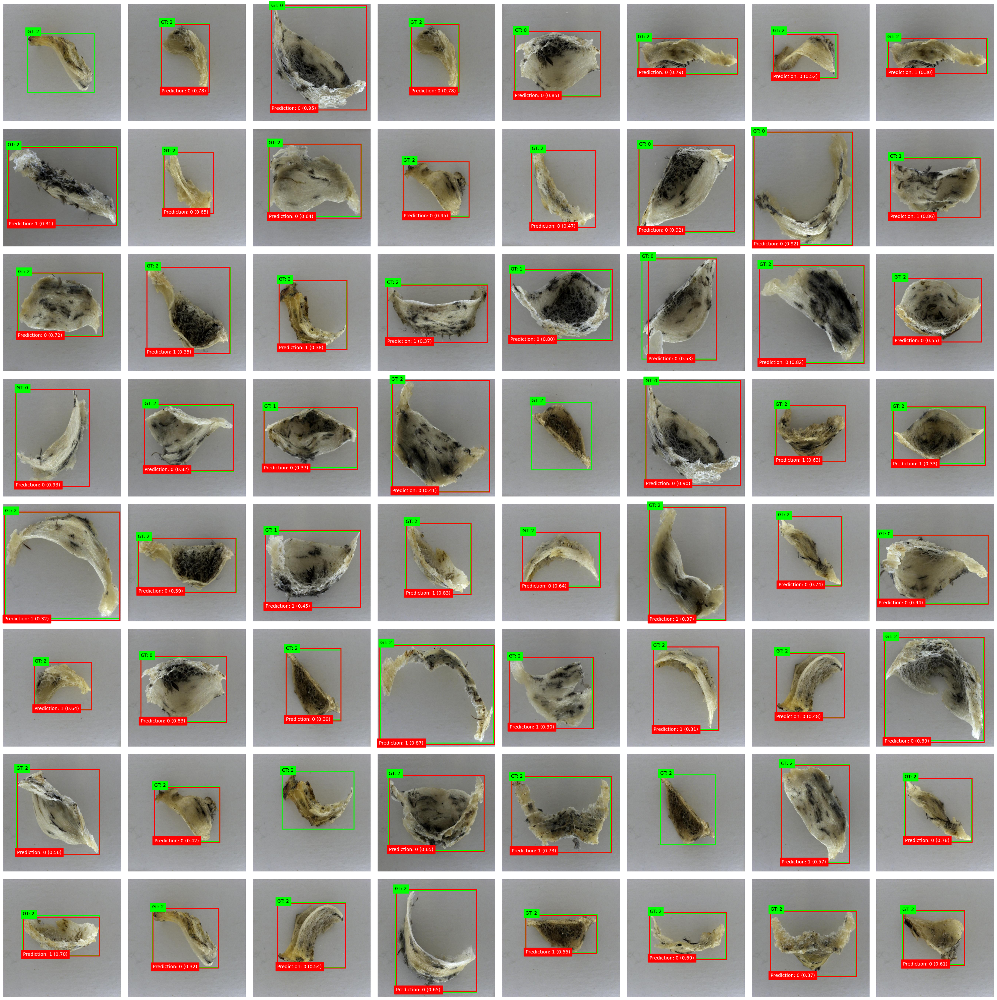

Grid generation complete.


In [36]:
# --- 1. CONFIGURATION ---
NUM_IMAGES = 64
GRID_SIZE = 8 # 8x8 grid
PRED_COLOR = 'red'
GT_COLOR = 'lime' # Bright green
CONF_THRESHOLD = 0.3 # Only show predictions above 30% confidence


# --- 2. PREPARE THE GRID ---
# (This assumes 'model', 'test_dataset', and 'processor' are already defined and loaded)
print(f"Using pre-loaded model: {model.__class__.__name__}")
fig, axes = plt.subplots(GRID_SIZE, GRID_SIZE, figsize=(30, 30))

# Flatten the 8x8 grid into a 64-item list for easy looping
axes_flat = axes.flat

# Get 64 random indices from the test set
total_images = len(test_dataset)
random_indices = random.sample(range(total_images), NUM_IMAGES)

print(f"Generating {NUM_IMAGES}-image grid... This will take a moment.")

# --- 3. RUN INFERENCE AND PLOT ---
with torch.no_grad(): # Ensure no gradients are calculated
    for i, ax in enumerate(tqdm(axes_flat, desc="Plotting Grid")):
        
        # --- A. Get Data ---
        # Get a random image and its ground truth target
        idx = random_indices[i]
        
        # test_dataset returns (PIL Image, list_of_dicts_in_coco_format)
        image, target_list = test_dataset[idx]
        
        # --- B. Get Model Prediction ---
        # Manually process this single image
        inputs = processor(images=image, return_tensors="pt").to(device)
        original_size = torch.tensor([[image.height, image.width]]).to(device)

        outputs = model(pixel_values=inputs["pixel_values"])
        
        # Post-process to get absolute pixel predictions [x1, y1, x2, y2]
        results = processor.post_process_object_detection(
            outputs, 
            target_sizes=original_size, 
            threshold=CONF_THRESHOLD
        )[0] # Get the first (and only) item in the batch
        
        # --- C. Draw Image ---
        ax.imshow(image)
        ax.axis('off')
        
        # --- D. Draw Ground Truth (GT) Boxes (Green) ---
        for gt in target_list:
            box = gt['bbox']
            # COCO format is [x_min, y_min, width, height]
            rect = patches.Rectangle(
                (box[0], box[1]), box[2], box[3], 
                linewidth=2, edgecolor=GT_COLOR, facecolor='none'
            )
            ax.add_patch(rect)
            
            # Add label (remembering our data is 1-indexed)
            ax.text(box[0], box[1], f"GT: {gt['category_id']-1}", 
                    color='black', backgroundcolor=GT_COLOR, fontsize=10)

        # --- E. Draw Prediction Boxes (Red) ---
        for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
            # Results format is [x_min, y_min, x_max, y_max]
            x1, y1, x2, y2 = box.cpu().numpy()
            w = x2 - x1
            h = y2 - y1
            
            rect = patches.Rectangle(
                (x1, y1), w, h, 
                linewidth=2, edgecolor=PRED_COLOR, facecolor='none'
            )
            ax.add_patch(rect)
            
            # Add label and score
            ax.text(x1, y1 + h, f"Prediction: {label.item()} ({score:.2f})", 
                    color='white', backgroundcolor=PRED_COLOR, fontsize=10)

# --- 4. SHOW PLOT ---
plt.tight_layout()
plt.show()

print("Grid generation complete.")